In [1]:
# split into train and test set
from os import listdir
from xml.etree import ElementTree
from numpy import zeros
from numpy import asarray
from mrcnn.utils import Dataset
from matplotlib import pyplot
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes
import os
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image,ImageDraw
from mrcnn.utils import extract_bboxes
from mrcnn.model import load_image_gt
from mrcnn.model import mold_image
from mrcnn.utils import compute_ap
from matplotlib.patches import Rectangle
import skimage
from numpy import random
from mrcnn import visualize

In [2]:
import tensorflow as tf

tf.__version__

'2.5.0'

In [3]:
# class that defines and loads the kangaroo dataset
class MathikereDataset(Dataset):
    
    # load the dataset definitions
    def load_dataset(self, dataset_dir, is_train=True):
        # define one class
        self.add_class("dataset", 1, "person")
        self.add_class("dataset", 2, "twowheeler")
        self.add_class("dataset", 3, "fourwheeler")
        
        
        # define data locations
        images_dir = dataset_dir + '/images/'
        annotations_dir = dataset_dir + '/annotations/'
        
        # find all images
        for filename in listdir(images_dir):
            # extract image id
            image_id = filename[:-4]
            
            image_No = image_id.replace("frame_","")
                
            # skip all images after 150 if we are building the train set
            if is_train and int(image_No) <= 150:
                continue
                
            # skip all images before 150 if we are building the test/val set
            if not is_train and int(image_No) >= 150:
                continue
                
            img_path = images_dir + filename
            ann_path = annotations_dir + image_id + '.xml'
            
            # add to dataset
            self.add_image('dataset', image_id=image_id, path=img_path, annotation=ann_path)

    # extract bounding boxes from an annotation file
    def extract_boxes(self, filename):
        # load and parse the file
        tree = ElementTree.parse(filename)
        # get the root of the document
        root = tree.getroot()
        # extract each bounding box
        boxes = list()
        for box in root.findall('.//bndbox'):
            xmin = int(box.find('xmin').text)
            ymin = int(box.find('ymin').text)
            xmax = int(box.find('xmax').text)
            ymax = int(box.find('ymax').text)
            coors = [xmin, ymin, xmax, ymax]
            boxes.append(coors)
        # extract image dimensions
        width = int(root.find('.//size/width').text)
        height = int(root.find('.//size/height').text)
        return boxes, width, height

    # load the masks for an image
    def load_mask(self, image_id):
        # get details of image
        info = self.image_info[image_id]
        # define box file location
        path = info['annotation']
        # load XML
        _,masks,_,class_ids, _, _ = self.extract_helper(path)            
        return masks, asarray(class_ids, dtype='int32')

    # load an image reference
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']
    

    # extract bounding boxes from an annotation file
    def extract_helper(self,filename):

        # labels

        # load and parse the file
#         path = "/home/saurav/Documents/Learning/KangarooDetection/Mask_RCNN/dataset/mathikere"
        tree = ElementTree.parse(filename)
        # get the root of the document
        root = tree.getroot()

        width = int(root.find('.//imagesize/nrows').text)
        height = int(root.find('.//imagesize/ncols').text)

#         print(width,height)

        boxes = list()
        names = list()
        img_polygons = list()
        masks = list()
        class_ids = list()

        for member in root.findall('object'):
            polygons = list()
            name = member.find("name").text
            class_id = self.class_names.index(name)

            for polypoints in member.findall('.//polygon/pt'):            
                x = int(float(polypoints.find("x").text))
                y = int(float(polypoints.find("y").text))
                polygons.append((x,y))

            # # polygons to bbox
            x,y,w,h = cv2.boundingRect(np.array(polygons))
            boxes.append((x,y,x+w,y+h))

            # polypoints to masks
            img = Image.new('L', (height,width), 0)
            ImageDraw.Draw(img).polygon(polygons, outline=1, fill=1)
            mask = np.array(img)


            # Add to list
            img_polygons.append(polygons)
            names.append(name)
            masks.append(mask)
            class_ids.append(class_id)
            
        masks = np.transpose(np.array(masks), (1, 2,0))


        return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height

    
    

(1080, 1920, 3)
(1080, 1920, 20)


<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height


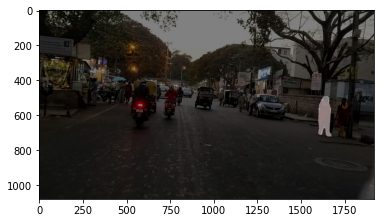

In [4]:
# train set
train_set = MathikereDataset()
train_set.load_dataset('./dataset/mathikere', is_train=True)
train_set.prepare()
# load an image
image_id = 0
image = train_set.load_image(image_id)
print(image.shape)
# load image mask
mask, class_ids = train_set.load_mask(image_id)
print(mask.shape)
# plot image
pyplot.imshow(image)
# plot mask
pyplot.imshow(mask[:, :, 0], cmap='gray', alpha=0.5)
pyplot.show()

In [5]:
# train set
train_set = MathikereDataset()
train_set.load_dataset('./dataset/mathikere', is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))

# test/val set
test_set = MathikereDataset()
test_set.load_dataset('./dataset/mathikere', is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

Train: 770
Test: 150


(1080, 1920, 3)
(1080, 1920, 20)


<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height


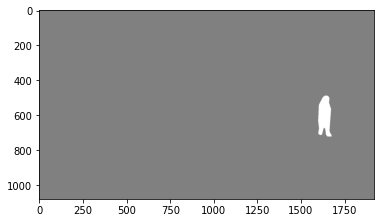

In [6]:
# train set
train_set = MathikereDataset()
train_set.load_dataset('./dataset/mathikere', is_train=True)
train_set.prepare()
# load an image
image_id = 0
image = train_set.load_image(image_id)
print(image.shape)
# load image mask
mask, class_ids = train_set.load_mask(image_id)
print(mask.shape)
# plot image
# pyplot.imshow(image)
# plot mask
pyplot.imshow(mask[:, :, 0], cmap='gray', alpha=0.5)
pyplot.show()

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height


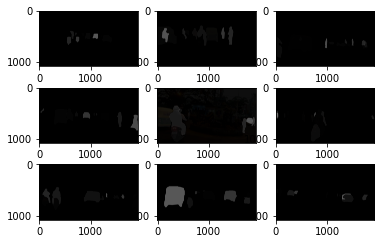

In [7]:
def show_many():
    # plot first few images
    for i in range(9):
        # define subplot
        pyplot.subplot(330 + 1 + i)
        # plot raw pixel data
        image = train_set.load_image(i)
        pyplot.imshow(image)
        # plot all masks
        mask, _ = train_set.load_mask(i)
        for j in range(mask.shape[2]):
            pyplot.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
    # show the figure
    pyplot.show()
    
show_many()

In [8]:
# using mrcnn visualise
# define image id
image_id = 1
# load the image
image = train_set.load_image(image_id)
# load the masks and the class ids
mask, class_ids = train_set.load_mask(image_id)

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height


In [9]:
# extract bounding boxes from the masks
bbox = extract_bboxes(mask)

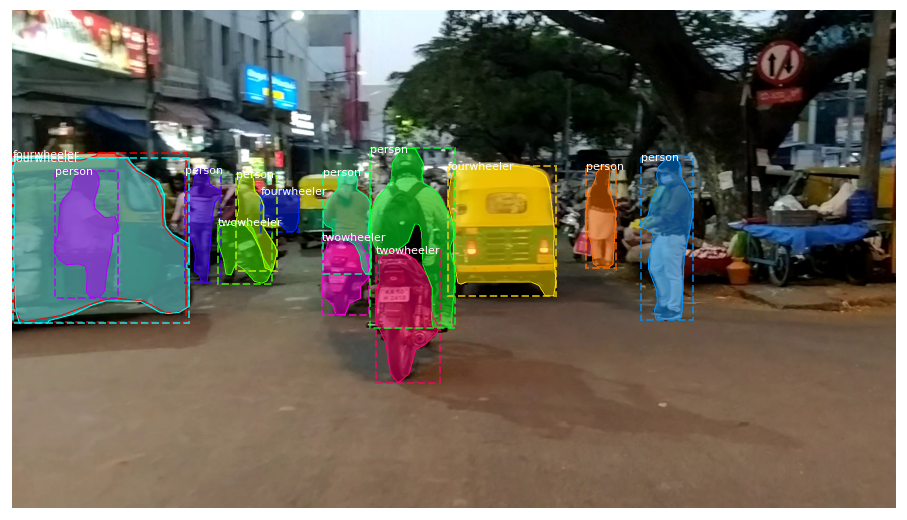

In [10]:
# display image with masks and bounding boxes
display_instances(image, bbox, mask, class_ids, train_set.class_names)

## References
1. https://www.programmersought.com/article/45855277089/
2. https://machinelearningmastery.com/how-to-perform-object-detection-with-yolov3-in-keras/
3. https://machinelearningmastery.com/how-to-train-an-object-detection-model-with-keras/
4. https://stackoverflow.com/questions/63061428/convert-labelimg-xml-rectangles-to-labelme-json-polygons-with-image-data
5. https://gilberttanner.com/blog/getting-started-with-mask-rcnn-in-keras
6. For TF 2:https://github.com/akTwelve/Mask_RCNN

-----

## Training

In [11]:
from mrcnn.config import Config
from mrcnn.model import MaskRCNN

In [12]:
# define a configuration for the model
class MathikereTrainConfig(Config):
    # define the name of the configuration
    NAME = "kangaroo_cfg"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
    # number of classes (background + no of class)
    NUM_CLASSES = 1 + 3
    # number of training steps per epoch
    STEPS_PER_EPOCH = 131

In [13]:
# train set
train_set = MathikereDataset()
train_set.load_dataset('./dataset/mathikere', is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))

Train: 770


In [14]:
# test/val set
test_set = MathikereDataset()
test_set.load_dataset('./dataset/mathikere', is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

Test: 150


In [15]:
# prepare config
config = MathikereTrainConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                16
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [16]:
# define the model
model = MaskRCNN(mode='training', model_dir='./', config=config)
# load weights (mscoco) and exclude the output layers
model.load_weights('./mask_rcnn_coco.h5', by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.


In [17]:
# train weights (output layers or 'heads')
model.train(train_set, test_set, learning_rate=config.LEARNING_RATE, epochs=0, layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: ./kangaroo_cfg20210829T2138/mask_rcnn_kangaroo_cfg_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_deconv      (TimeDistri

/home/saurav/anaconda3/envs/simple-train-tflatest/lib/python3.8/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:374: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

## Evaluate

In [70]:
# define the prediction configuration
class PredictionConfig(Config):
    # define the name of the configuration
    NAME = "kangaroo_cfg"
    # number of classes (background + kangaroo)
    NUM_CLASSES = 1 + 3
    # simplify GPU config
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False


In [71]:
# create config
cfg = PredictionConfig()

# define the model
model = MaskRCNN(mode='inference', model_dir='./', config=cfg)

# load model weights
model.load_weights('./models/mathikere/mask_rcnn_kangaroo_cfg_0005.h5', by_name=True)

In [72]:
# calculate the mAP for a model on a given dataset
def evaluate_model(dataset, model, cfg):
    APs = list()
    for image_id in dataset.image_ids:
        # load image, bounding boxes and masks for the image id
        image, image_meta, gt_class_id, gt_bbox, gt_mask = load_image_gt(dataset, cfg, image_id)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = np.expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0)
        # extract results for first sample
        r = yhat[0]
        # calculate statistics, including AP
        AP, _, _, _ = compute_ap(gt_bbox, gt_class_id, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'])
        # store
        APs.append(AP)
    # calculate the mean AP across all images
    mAP = mean(APs)
    return mAP




In [23]:
############################################################
#  COCO Evaluation
############################################################

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from pycocotools import mask as maskUtils


def build_coco_results(dataset, image_ids, rois, class_ids, scores, masks):
    """Arrange resutls to match COCO specs in http://cocodataset.org/#format
    """
    # If no results, return an empty list
    if rois is None:
        return []

    results = []
    for image_id in image_ids:
        # Loop through detections
        for i in range(rois.shape[0]):
            class_id = class_ids[i]
            score = scores[i]
            bbox = np.around(rois[i], 1)
            mask = masks[:, :, i]

            result = {
                "image_id": image_id,
                "category_id": dataset.get_source_class_id(class_id, "coco"),
                "bbox": [bbox[1], bbox[0], bbox[3] - bbox[1], bbox[2] - bbox[0]],
                "score": score,
                "segmentation": maskUtils.encode(np.asfortranarray(mask))
            }
            results.append(result)
    return results

def evaluate_coco(model, dataset, coco, eval_type="bbox", limit=0, image_ids=None):
    """Runs official COCO evaluation.
    dataset: A Dataset object with valiadtion data
    eval_type: "bbox" or "segm" for bounding box or segmentation evaluation
    limit: if not 0, it's the number of images to use for evaluation
    """
    # Pick COCO images from the dataset
    image_ids = image_ids or dataset.image_ids

    # Limit to a subset
    if limit:
        image_ids = image_ids[:limit]

    # Get corresponding COCO image IDs.
    coco_image_ids = [dataset.image_info[id]["id"] for id in image_ids]

    t_prediction = 0
    t_start = time.time()

    results = []
    for i, image_id in enumerate(image_ids):
        # Load image
        image = dataset.load_image(image_id)

        # Run detection
        t = time.time()
        r = model.detect([image], verbose=0)[0]
        t_prediction += (time.time() - t)

        # Convert results to COCO format
        # Cast masks to uint8 because COCO tools errors out on bool
        image_results = build_coco_results(dataset, coco_image_ids[i:i + 1],
                                           r["rois"], r["class_ids"],
                                           r["scores"],
                                           r["masks"].astype(np.uint8))
        results.extend(image_results)

    # Load results. This modifies results with additional attributes.
    coco_results = coco.loadRes(results)

    # Evaluate
    cocoEval = COCOeval(coco, coco_results, eval_type)
    cocoEval.params.imgIds = coco_image_ids
    cocoEval.evaluate()
    cocoEval.accumulate()
    cocoEval.summarize()

    print("Prediction time: {}. Average {}/image".format(
        t_prediction, t_prediction / len(image_ids)))
    print("Total time: ", time.time() - t_start)


In [74]:
# # evaluate model on training dataset
# train_mAP = evaluate_model(train_set, model, cfg)
# print("Train mAP: %.3f" % train_mAP)
# # evaluate model on test dataset
# test_mAP = evaluate_model(test_set, model, cfg)
# print("Test mAP: %.3f" % test_mAP)

In [26]:
# TODO: Add coco API Evaluation internally

## Detect on some images

In [27]:
# plot a number of photos with ground truth and predictions
def plot_actual_vs_predicted(dataset, model, cfg, n_images=5):
    # load image and mask
    for i in range(n_images):
        pyplot.figure(figsize=(50, 50), dpi=80)
        
        # load the image and mask
        image = dataset.load_image(i)
        mask, _ = dataset.load_mask(i)
        
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        
        # convert image into one sample
        sample = np.expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0)[0]
        # define subplot
        pyplot.subplot(n_images, 2, i*2+1)
        # plot raw pixel data
        pyplot.imshow(image)
        pyplot.title('Actual')
        # plot masks
        for j in range(mask.shape[2]):
            pyplot.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
        # get the context for drawing boxes
        pyplot.subplot(n_images, 2, i*2+2)
        # plot raw pixel data
        pyplot.imshow(image)
        pyplot.title('Predicted')
        ax = pyplot.gca()
        # plot each box
        for box in yhat['rois']:
            # get coordinates
            y1, x1, y2, x2 = box
            # calculate width and height of the box
            width, height = x2 - x1, y2 - y1
            # create the shape
            rect = Rectangle((x1, y1), width, height, fill=False, color='red')
            # draw the box
            ax.add_patch(rect)
    # show the figure
    pyplot.show()

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height


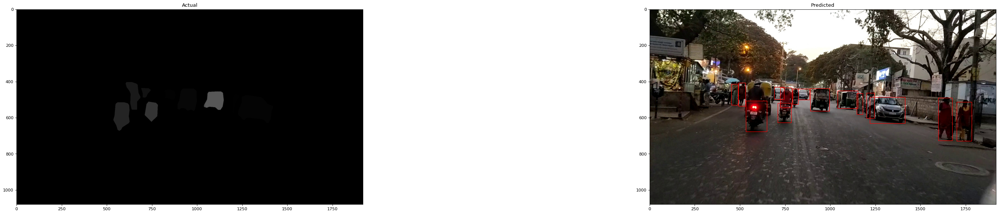

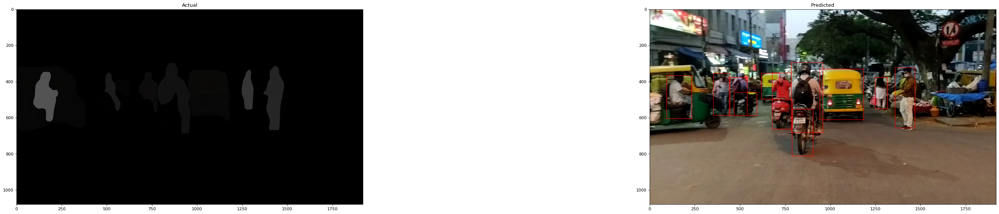

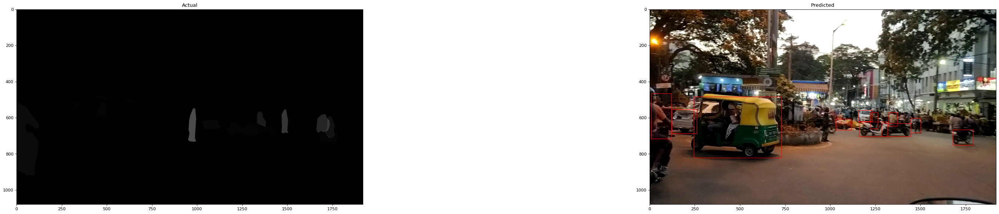

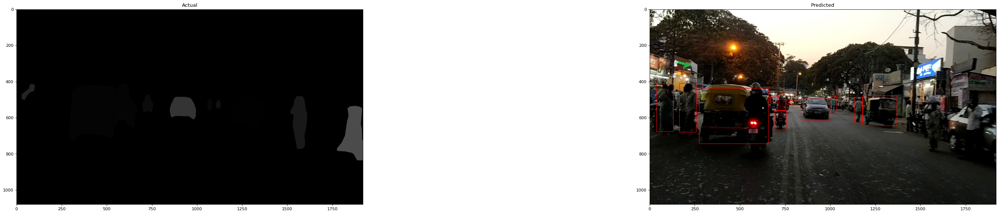

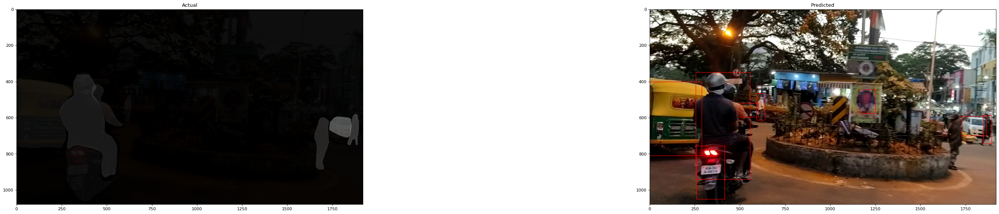

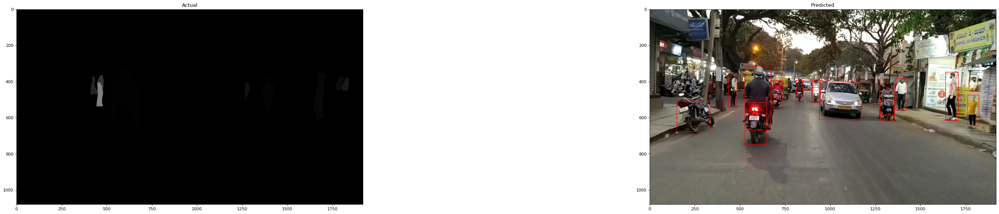

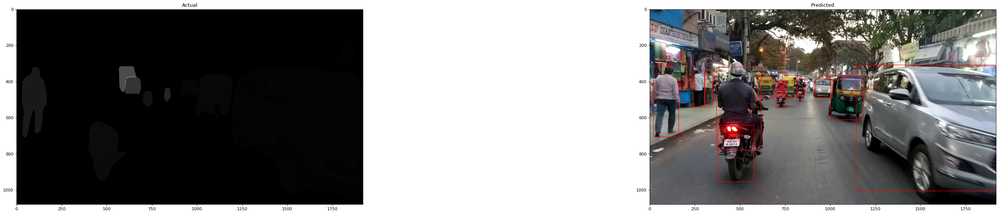

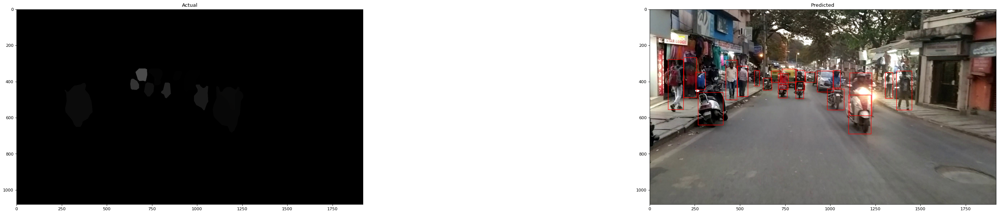

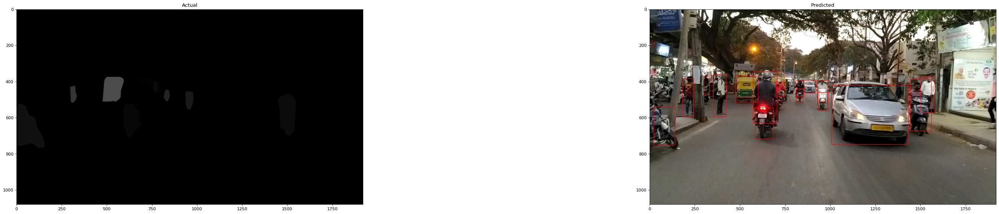

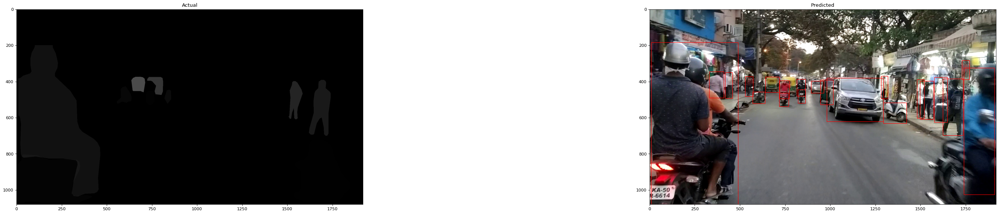

In [28]:
# plot predictions for train dataset
plot_actual_vs_predicted(train_set, model, cfg)

# plot predictions for test dataset
plot_actual_vs_predicted(test_set, model, cfg)

---

---

## Coco Evaluation

In [31]:
# train set
train_set = MathikereDataset()
train_set.load_dataset('./dataset/mathikere', is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))


Train: 770


In [32]:
# image_name = train_set.image_from_source_map["%s.%s"%(train_set.sources[1],"frame_000888")]
# image_name

info = train_set.image_info[1]
info


{'id': 'frame_000888',
 'source': 'dataset',
 'path': './dataset/mathikere/images/frame_000888.jpg',
 'annotation': './dataset/mathikere/annotations/frame_000888.xml'}

In [33]:
def extract_coco_categories(dataset):
    categories_list = list()
    for class_id,name in zip(dataset.class_ids,dataset.class_names):
        categories_list.append(
        {
            "supercategory": name,
            "name": name,
            "id": int(class_id)
        })
        
    return categories_list[1:]
        
    
    
def extract_coco_images_annotations(dataset,image_id):

    # path = "/home/saurav/Documents/Learning/KangarooDetection/Mask_RCNN/dataset/mathikere"
    info = train_set.image_info[image_id]
    
    
    tree = ElementTree.parse(info["annotation"])
    # get the root of the document
    root = tree.getroot()

    width = int(root.find('.//imagesize/nrows').text)
    height = int(root.find('.//imagesize/ncols').text)

#     img_name = info["path"].split("/")[-1].split(".")
    
    image_dict = {
        "file_name": info["path"].split("/")[-1],
        "id": int(image_id),
        "width": int(width),
        "height": int(height)
    }
        

        
    boxes = list()
    names = list()
    img_polygons = list()
    masks = list()
    class_ids = list()
    
    annotations_list = list()
    annotations_dict = {
            "iscrowd": 0,
            "category_id": None, # to calculate
            "image_id": int(image_id),
            "segmentation": [ # to calculate
                [
                    
                ]
            ],
            "id": None, # to calculate
            "bbox": [155.0,109.0,100.0,98.0], # to calculate
            "area": 0.0 # to calculate
        }

    for member in root.findall('object'):
        polygons = list()
        cv2_ploygons = list()
        
        name = member.find("name").text
        class_id = dataset.class_names.index(name)

        for polypoints in member.findall('.//polygon/pt'):            
            x = int(float(polypoints.find("x").text))
            y = int(float(polypoints.find("y").text))
            polygons.extend([x,y])
            cv2_ploygons.append((x,y))
            
        
        # # polygons to bbox
        x,y,w,h = cv2.boundingRect(np.array(cv2_ploygons))
        if image_id ==1 and class_id == 2:
            print(info['id'],x,y,w,h)
        boxes.append((x,y,x+w,y+h))

        
        annotations_dict["id"] = 0
        annotations_dict["category_id"] = int(class_id)
        annotations_dict["segmentation"]=[polygons]
        annotations_dict["bbox"] = [float(x),float(y),float(w),float(h)]
        annotations_dict["area"] = float(w*h)
#         print("image_id",image_id)


        annotations_list.append(annotations_dict)
        
        

    return image_dict,annotations_list


def add_unique_seg_id(annotations_list):
    
    for seg_id in range(len(annotations_list)):
        annotations_list[seg_id]["id"] =  seg_id
        
    return annotations_list


def save_to_json(name,category_list,images_list,annotations_list):
    import numpy as np
    import json


    class NpEncoder(json.JSONEncoder):
        def default(self, obj):
            if isinstance(obj, np.integer):
                return int(obj)
            if isinstance(obj, np.floating):
                return float(obj)
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            return super(NpEncoder, self).default(obj)

    
    coco_dictionary = {
        "images": images_list,
        "categories": category_list,
        "annotations":annotations_list
    }
    try:
        with open("%s.json"%(name), "w") as outfile:
            json.dump(coco_dictionary, outfile, cls=NpEncoder)
    except Exception as e:
        print(e)
    finally:
        print("Done")
    print("Done")   
    return coco_dictionary
    

In [34]:
dataset = test_set

In [35]:
category_list = extract_coco_categories(dataset)
# category_list

[{'supercategory': 'person', 'name': 'person', 'id': 1},
 {'supercategory': 'twowheeler', 'name': 'twowheeler', 'id': 2},
 {'supercategory': 'fourwheeler', 'name': 'fourwheeler', 'id': 3}]

In [36]:
# image_dict,annotations_list = extract_coco_images_annotations(train_set,1)

In [37]:
image_lists = list()
annotations_lists = list()

for image_id in dataset.image_ids:
    image_dict, annotation_list = extract_coco_images_annotations(dataset,image_id)
    
    image_lists.append(image_dict)
    annotations_lists.extend(annotation_list)


frame_000888 674 490 102 170
frame_000888 791 519 139 288
frame_000888 447 458 118 134


In [38]:
annotations_lists =  add_unique_seg_id(annotations_lists)


In [39]:
coco_dictionary = {
        "images": image_lists,
        "categories": category_list,
        "annotations":annotations_lists
}

In [40]:
import json
with open("temp1.json", "w") as outfile:
    json.dump(coco_dictionary, outfile)

In [41]:
# coco_gd_annotations = save_to_json("temp",category_list,image_lists,annotations_list)

In [43]:
%matplotlib inline
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import numpy as np
import skimage.io as io
import pylab
import time
from pycocotools import mask as maskUtils
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

In [44]:
annFile = "temp.json"
cocoGt=COCO(annFile)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [45]:

def build_coco_results(dataset, image_ids, rois, class_ids, scores, masks):
    """Arrange resutls to match COCO specs in http://cocodataset.org/#format
    """
    global imagename_to_coco_image_id
    # If no results, return an empty list
    if rois is None:
        return []

    results = []
    for image_id in [image_ids]:
        # Loop through detections
        for i in range(rois.shape[0]):
            class_id = class_ids[i]
            score = scores[i]
            bbox = np.around(rois[i], 1)
            mask = masks[:, :, i]

            # image_id ==> name 
            imgName = dataset.image_info[image_id]["id"]
            print(imgName)
            
            coco_img_id = imagename_to_coco_image_id[imgName]
            
            result = {
                "image_id": coco_img_id,
                "category_id": dataset.get_source_class_id(class_id, "dataset"),
                "bbox": [bbox[1], bbox[0], bbox[3] - bbox[1], bbox[2] - bbox[0]],
                "score": score,
                "segmentation": maskUtils.encode(np.asfortranarray(mask))
            }
            results.append(result)
    return results


def evaluate_coco(model, dataset, coco, eval_type="bbox", limit=0, image_ids=None):
    """Runs official COCO evaluation.
    dataset: A Dataset object with valiadtion data
    eval_type: "bbox" or "segm" for bounding box or segmentation evaluation
    limit: if not 0, it's the number of images to use for evaluation
    """
    # Pick COCO images from the dataset
    image_ids = image_ids or dataset.image_ids

    # Limit to a subset
    if limit:
        image_ids = image_ids[:limit]

    # Get corresponding COCO image IDs.
#     coco_image_ids = [dataset.image_info[id]["id"] for id in image_ids]

    t_prediction = 0
    t_start = time.time()

    results = []
    for i, image_id in enumerate(image_ids):
        # Load image
        image = dataset.load_image(image_id)

        # Run detection
        t = time.time()
        r = model.detect([image], verbose=0)[0]
        t_prediction += (time.time() - t)

        # Convert results to COCO format
        # Cast masks to uint8 because COCO tools errors out on bool
        image_results = build_coco_results(dataset, image_id, #coco_image_ids[i:i + 1],
                                           r["rois"], r["class_ids"],
                                           r["scores"],
                                           r["masks"].astype(np.uint8))
        results.extend(image_results)
        
    return results

# # Load results. This modifies results with additional attributes.
# coco_results = coco.loadRes(results)

# # Evaluate
# cocoEval = COCOeval(coco, coco_results, eval_type)
# cocoEval.params.imgIds = coco_image_ids
# cocoEval.evaluate()
# cocoEval.accumulate()
# cocoEval.summarize()

# print("Prediction time: {}. Average {}/image".format(
#     t_prediction, t_prediction / len(image_ids)))
# print("Total time: ", time.time() - t_start)


In [46]:
len(dataset.image_info)

150

In [48]:
# # Load results. This modifies results with additional attributes.

# annFile = "temp1.json"

annFile = "/home/saurav/Downloads/coco-mathikere/annotations/instances_default.json"
cocoGt = COCO(annFile)

imagename_to_coco_image_id = {}
for item in cocoGt.__dict__["dataset"]["images"]:
    file_name = item["file_name"].split(".")[0]
    imagename_to_coco_image_id[file_name] = item["id"]
    

loading annotations into memory...
Done (t=0.16s)
creating index...
index created!


In [50]:
# coco_predict_res = evaluate_coco(model, dataset, cocoGt, eval_type="bbox", limit=0, image_ids=None)
# t = coco_predict_res.copy()

In [52]:
# coco_predict_res = np.array(coco_predict_res)
# with open('pred.npy', 'wb') as f:
#     np.save(f, np.array(t),allow_pickle=True)

with open('pred.npy', 'rb') as f:
    t = np.load(f,allow_pickle=True)

coco_predict_res2 = t.tolist()

In [53]:
coco_results = cocoGt.loadRes(coco_predict_res2)

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!


In [54]:
test_image_ids = sorted(cocoGt.getImgIds())

In [55]:
# Evaluate
cocoEval = COCOeval(cocoGt, coco_results, "bbox")

cocoEval.params.imgIds = test_image_ids
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

# print("Prediction time: {}. Average {}/image".format(
#     t_prediction, t_prediction / len(image_ids)))
# print("Total time: ", time.time() - t_start)

Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.39s).
Accumulating evaluation results...
DONE (t=0.15s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.089
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.151
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.090
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.023
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.095
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.003
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100

----

# PR Curve

In [75]:
import mrcnn.model as modellib
from mrcnn.model import log
from mrcnn import utils


In [76]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height


image ID: dataset.frame_000149 (142) ./dataset/mathikere/images/frame_000149.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (18,)                 min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (18, 4)               min:   41.00000  max:  957.00000  int32
gt_mask                  shape: (1024, 1024, 18)      min:    0.00000  max:    1.00000  uint8


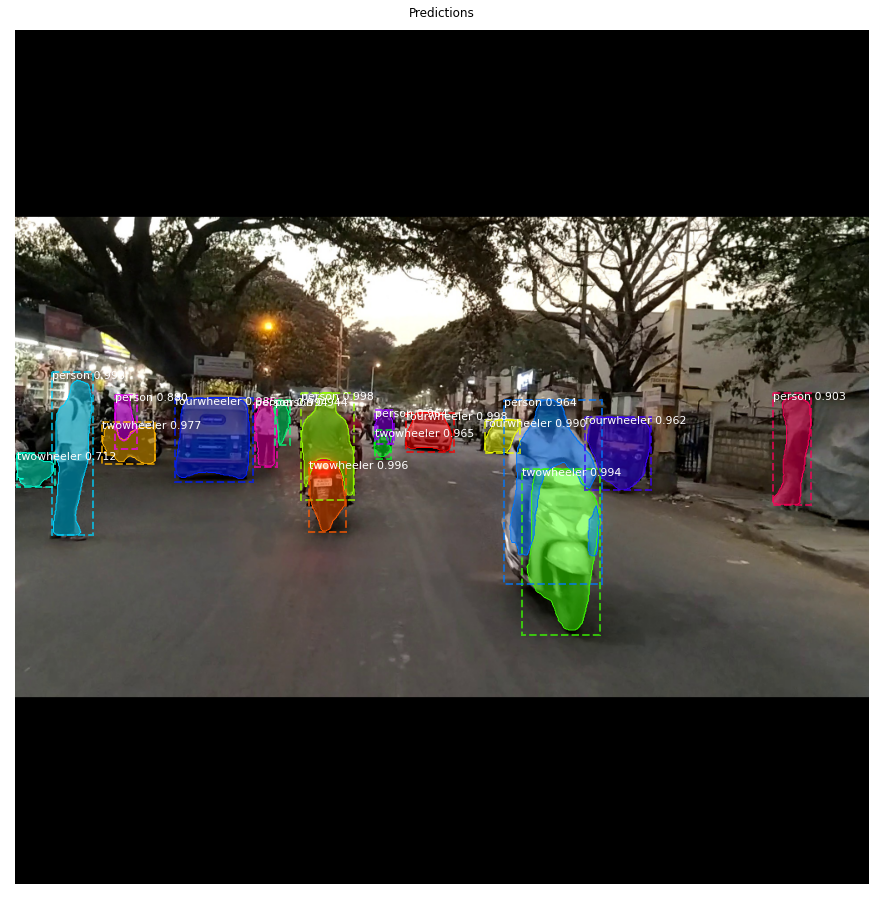

In [77]:
# plot PR Curve



image_id = random.choice(dataset.image_ids)

image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, cfg, image_id)

info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

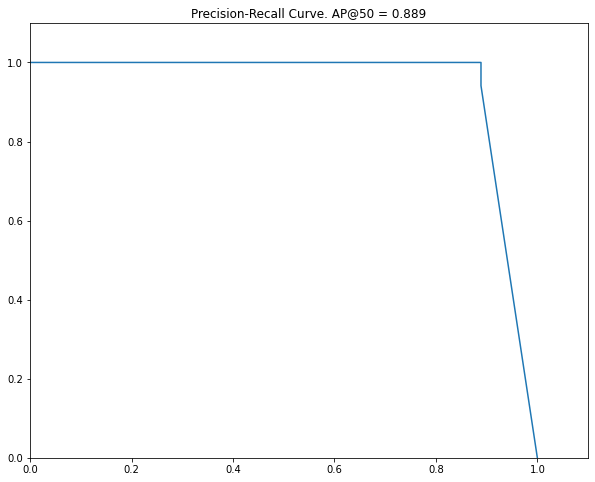

In [78]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
visualize.plot_precision_recall(AP, precisions, recalls)

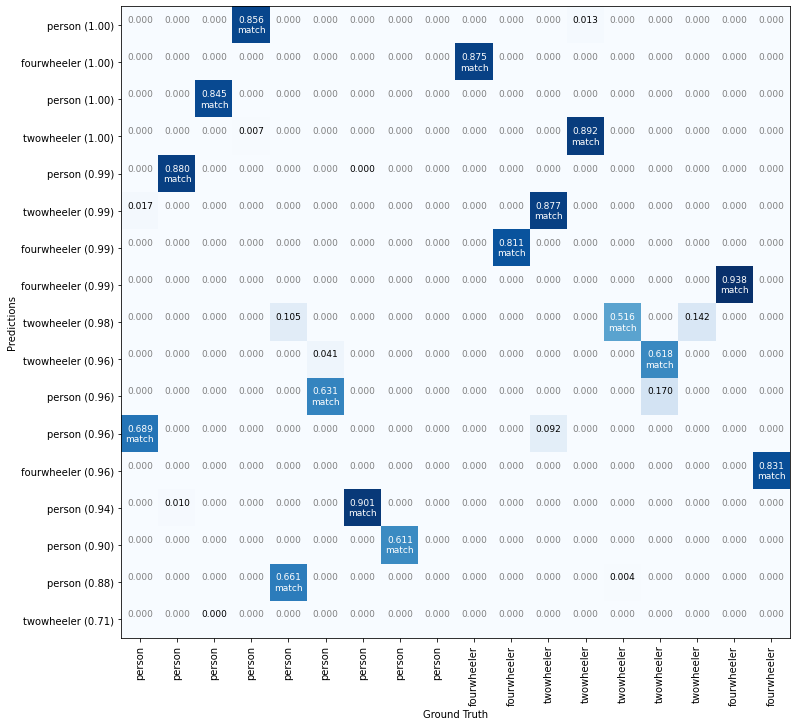

In [79]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

In [85]:
# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, cfg,
                                   image_id)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'])
        APs.append(AP)
    return APs

# Pick a set of random images
# image_ids = np.random.choice(dataset.image_ids, 10)
APs = compute_batch_ap(dataset.image_ids)
print("mAP @ IoU=50: ", np.mean(APs))
# mAP @ IoU=50:  0.7496095470491948

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(img_polygons),np.array(masks), np.array(boxes), np.array(class_ids), width, height
<ipython-input-3-9ea1aded8789>:124: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or s

mAP @ IoU=50:  0.7496095470491948


---

## Make a Video

In [ ]:
import os
import sys
import numpy as np
np.random.seed(0)
import matplotlib.pyplot as plt
import cv2
import argparse

# Root directory of the project

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

# sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))
# import coco

In [ ]:
def apply_mask(image, mask, color, alpha=0.5):
    """apply mask to image"""
    for n, c in enumerate(color):
        image[:, :, n] = np.where(
            mask == 1,
            image[:, :, n] * (1 - alpha) + alpha * c,
            image[:, :, n]
        )
    return image

In [ ]:
# based on https://github.com/matterport/Mask_RCNN/blob/master/mrcnn/visualize.py
# and https://github.com/markjay4k/Mask-RCNN-series/blob/887404d990695a7bf7f180e3ffaee939fbd9a1cf/visualize_cv.py

# colors = [tuple(255 * np.random.rand(3)) for _ in range(3)]
colors = [(245, 178, 137),(107, 139, 202),(186, 233, 154)]

def display_instances(image, boxes, masks, class_ids, class_names, scores=None):
    assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]
    
    N = boxes.shape[0]

    for i in range(N):
        if not np.any(boxes[i]):
            continue
        
        y1, x1, y2, x2 = boxes[i]
        label = class_names[class_ids[i]]
        
        color = colors[class_ids[i]-1]
        
        score = scores[i] if scores is not None else None
        caption = "{} {:.3f}".format(label, score) if score else label

        # Mask
        mask = masks[:, :, i]
        image = apply_mask(image, mask, color)
        image = cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        image = cv2.putText(image, caption, (x1, y1), cv2.FONT_HERSHEY_COMPLEX, 0.7, color, 2)
    return image

In [ ]:
# define the prediction configuration
class PredictionConfig(Config):
    # define the name of the configuration
    NAME = "kangaroo_cfg"
    # number of classes (background + kangaroo)
    NUM_CLASSES = 1 + 3
    # simplify GPU config
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

In [ ]:
# parser = argparse.ArgumentParser(description='MaskRCNN Video Object Detection/Instance Segmentation')
# parser.add_argument('-v', '--video_path', type=str, default='', help='Path to video. If None camera will be used')
# parser.add_argument('-sp', '--save_path', type=str, default='', help= 'Path to save the output. If None output won\'t be saved')
# parser.add_argument('-s', '--show', default=True, action="store_false", help='Show output')
# args = parser.parse_args()

args ={
    "video_path":"./dataset/mathikere/VID_20210323_183723.mp4",
    "save_path":"output.avi",
    "MODEL_PATH":"./models/mathikere/mask_rcnn_kangaroo_cfg_0005.h5",
    "show":True 
}

In [ ]:
class_names = ['BG',"person","twowheeler","fourwheeler" ]
config = PredictionConfig()

# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir="./", config=config)

# Load weights trained on MS-COCO
model.load_weights(args["MODEL_PATH"], by_name=True)

In [ ]:
count = 0
if args["video_path"] != '':
    cap = cv2.VideoCapture(args["video_path"])
else:
    cap = cv2.VideoCapture(0)

if args["save_path"]:
    width = int(cap.get(3))
    height = int(cap.get(4))
    fps = 3 #cap.get(cv2.CAP_PROP_FPS)
    out = cv2.VideoWriter(args["save_path"], cv2.VideoWriter_fourcc('M','J','P','G'), fps, (width, height))

try:
    while cap.isOpened():
        ret, image = cap.read()
        if ret:
            results = model.detect([image], verbose=0)
            r = results[0]
            image = display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

            if False and args["show"]:
                cv2.imshow('MaskRCNN Object Detection/Instance Segmentation', image)
                if cv2.waitKey(1) & 0xFF == ord('q'):
                    break

            if args["save_path"]:
                out.write(image)
                count+=1
                print(count)
                if count==15:
                    break
        else:
            break
except Exception as e:
    print(e)
finally:
    cap.release()
    if args["save_path"]:
        out.release()
    cv2.destroyAllWindows()